In [1]:
import sys, os

import matplotlib.pyplot as plt
import torch
from medmnist import INFO

In [2]:
root = os.path.abspath(os.path.join(os.getcwd(), ".."))
if root not in sys.path:
    sys.path.insert(0, root)

In [3]:
from data import get_data
from models import AlexNet28, AlexNet128,\
                    DeconvNet28, DeconvNet128, GradCam,\
                    get_occlusion_result, plot_occlusion_entry

In [4]:
# Initial system configurations
device = torch.device("cpu")

dataset_dir = "../data/dataset"
models_dir = "../models/trained_models/"

figs_folder = "figures"
os.makedirs(figs_folder, exist_ok=True)

#### Occlusion Functions

In [ ]:
def get_occlusion_result(img, label, x, y, patch_size):
    """
    Applies grey square occlusion and returns relevant values.
    """
    occluded = img.clone()                                # copy input image
    occluded[:, :, y:y+patch_size, x:x+patch_size] = 0.5  # apply the grey square

    with torch.no_grad():
        logits_occ, acts_occ = alexnet(occluded)                  # forward pass the occluded img through the model
        feat5_occ = acts_occ["feat5"]                             # extract feature map activations from layer 5
        prob_occ = F.softmax(logits_occ, dim=1)[0, label].item()  # compute probability of true class with softmax
        pred_class = logits_occ.argmax(dim=1).item()              # get the predicted class
        # compute the total activation of the strongest feature map in layer 5
        activation = feat5_occ[0, strongest_idx].sum().item()    

    # Return:
    # the occluded image (converted to shape [3, H, W] and moved to CPU)
    # the total activation value of the strongest feature
    # the probability of the true class
    # the predicted class index
    return occluded.squeeze().cpu(), activation, prob_occ, pred_class

def generate_occlusion_maps(img, label, patch_size=64, stride=10):
    H, W = img.shape[2:]
    xs = list(range(0, W - patch_size + 1, stride))
    ys = list(range(0, H - patch_size + 1, stride))

    activation_map = np.zeros((len(ys), len(xs)))
    prob_map = np.zeros((len(ys), len(xs)))
    pred_map = np.zeros((len(ys), len(xs)), dtype=int)

    for i, y in enumerate(ys):
        for j, x in enumerate(xs):
            _, act, prob, pred = get_occlusion_result(img, label, x, y, patch_size)
            activation_map[i, j] = act
            prob_map[i, j] = prob
            pred_map[i, j] = pred

    return activation_map, prob_map, pred_map,xs, ys

def plot_occlusion_entry(occluded_img, activation_map, prob_map, pred_map, pred_class, recon_np, x, y, xs, ys):

    fig, axs = plt.subplots(1, 5, figsize=(20, 4))

    axs[0].imshow(to_pil_image(occluded_img))
    axs[0].set_title(f"(a) Patch at ({x},{y})")
    axs[0].axis("off")

    # im1 = axs[1].imshow(activation_map, cmap="hot", extent=[xs[0], xs[-1]+1, ys[-1]+1, ys[0]])
    axs[1].imshow(activation_map, cmap="hot", extent=[xs[0], xs[-1]+1, ys[-1]+1, ys[0]])
    axs[1].set_title("(b) Layer 5 activation map")
    # fig.colorbar(im1, ax=axs[1])

    axs[2].imshow(recon_np)
    axs[2].set_title(f"(c) Feature projection")
    axs[2].axis("off")


    im2 = axs[3].imshow(prob_map, cmap="coolwarm", vmin=0, vmax=1, extent=[xs[0], xs[-1]+1, ys[-1]+1, ys[0]])
    axs[3].set_title(f"(d) P(true class)")
    fig.colorbar(im2, ax=axs[3])
    

    pred_name = class_names.get(pred_class, str(pred_class))
    axs[4].imshow(pred_map, cmap="tab20", extent=[xs[0], xs[-1]+1, ys[-1]+1, ys[0]])
    axs[4].set_title(f"(e) Predicted class:\n{pred_name}")
    axs[4].axis("off")
    fig.savefig(f"blood_occlusion{patch_size}.png", dpi=200)
    plt.tight_layout()
    plt.show()


## Testing on PathMNIST

In [5]:
dataset_name = "PathMNIST"
num_classes = 9
model_file = "alexnet128_pathmnist.pth"

In [6]:
# Loading data

train_loader, val_loader, test_loader = get_data(
    dataset_name=dataset_name,
    im_size=128,
    batch_size=4,
    data_dir=dataset_dir
)

In [7]:
info = INFO["pathmnist"]
class_names = {int(k): v for k, v in info["label"].items()}

In [8]:
imgs, labels = next(iter(train_loader))
print("raw loader imgs:", imgs.shape)

raw loader imgs: torch.Size([64, 3, 128, 128])


In [9]:
model = AlexNet128(num_classes=num_classes)

state_dict = torch.load(models_dir+model_file,
    map_location=torch.device(device) )

model.load_state_dict(state_dict)
model.eval()

AlexNet128(
  (conv1): Conv2d(3, 64, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
  (relu1): ReLU()
  (pool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (relu2): ReLU()
  (pool2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv3): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu3): ReLU()
  (conv4): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu4): ReLU()
  (conv5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu5): ReLU()
  (pool5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (dropout1): Dropout(p=0.5, inplace=False)
  (fc1): Linear(in_features=9216, out_features=4096, bias=True)
  (relu_fc1): ReLU()
  (dropout2): Dropout(p=0.5, inplace=False)
  (fc2): Linear(in_featur

In [10]:
deconv = DeconvNet128(model)
deconv.eval()

DeconvNet128(
  (unpool5): MaxUnpool2d(kernel_size=(3, 3), stride=(2, 2), padding=(0, 0))
  (deconv5): ConvTranspose2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (relu5): ReLU()
  (deconv4): ConvTranspose2d(256, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (relu4): ReLU()
  (deconv3): ConvTranspose2d(384, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (relu3): ReLU()
  (unpool2): MaxUnpool2d(kernel_size=(3, 3), stride=(2, 2), padding=(0, 0))
  (deconv2): ConvTranspose2d(192, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2), bias=False)
  (relu2): ReLU()
  (unpool1): MaxUnpool2d(kernel_size=(3, 3), stride=(2, 2), padding=(0, 0))
  (deconv1): ConvTranspose2d(64, 3, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1), bias=False)
  (relu1): ReLU()
)

In [11]:
gradcam = GradCam(model)
gradcam.eval()

GradCam(
  (model): AlexNet128(
    (conv1): Conv2d(3, 64, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (relu1): ReLU()
    (pool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv2): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (relu2): ReLU()
    (pool2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv3): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu3): ReLU()
    (conv4): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu4): ReLU()
    (conv5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu5): ReLU()
    (pool5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
    (dropout1): Dropout(p=0.5, inplace=False)
    (fc1): Linear(in_features=9216, out_features=4096, bias=True)
    (relu_fc1): ReLU()
    (dropout2):

Layer  1


/Users/mar_sangineto/anaconda3/envs/IMAnotebook/lib/python3.12/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


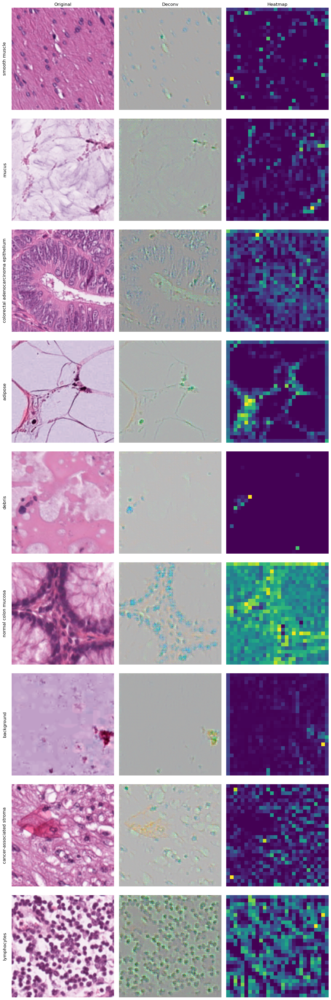

Layer  2


/Users/mar_sangineto/anaconda3/envs/IMAnotebook/lib/python3.12/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


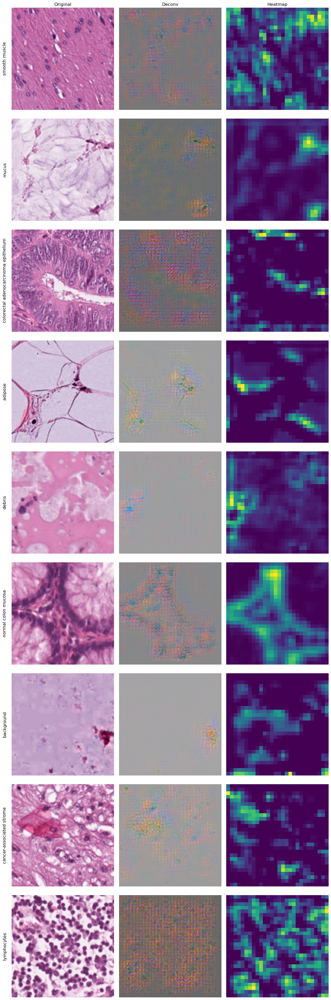

Layer  3


/Users/mar_sangineto/anaconda3/envs/IMAnotebook/lib/python3.12/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


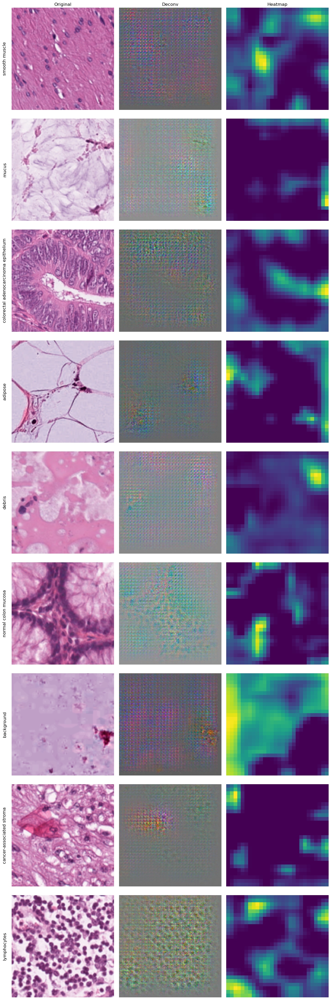

Layer  4


/Users/mar_sangineto/anaconda3/envs/IMAnotebook/lib/python3.12/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


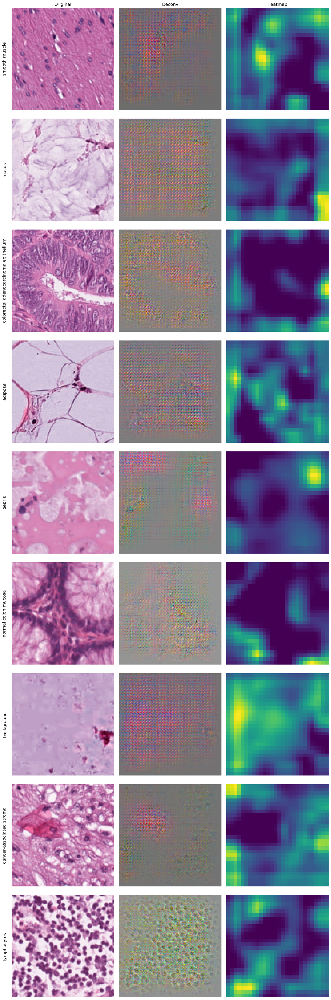

Layer  5


/Users/mar_sangineto/anaconda3/envs/IMAnotebook/lib/python3.12/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


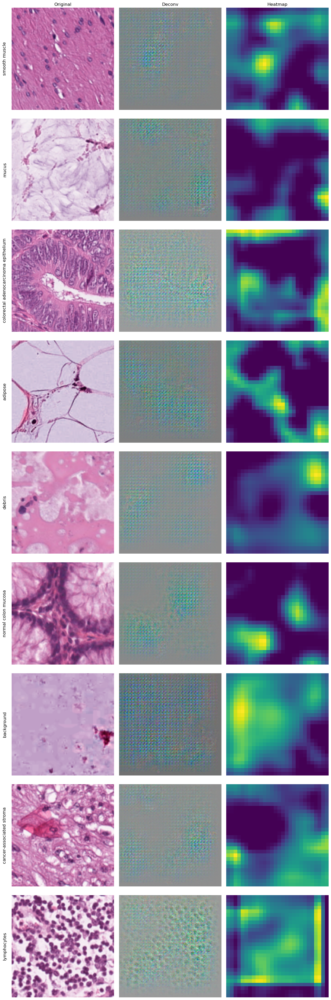

In [12]:
for L in range(5):
    L += 1
    print("Layer ", L)
    classes = {}
    for idx in range(len(imgs)):
        model = AlexNet128(num_classes=num_classes)
    
        state_dict = torch.load(models_dir+model_file,
            map_location=torch.device(device) )
        
        model.load_state_dict(state_dict)
    
        deconv = DeconvNet128(model)
    
        gradcam = GradCam(model)
        
        img = imgs[idx:idx+1]
        clss = int(labels[idx][0])
        _, acts = model(img)

        feat_all = acts[f"feat{L}"]         # [1, C, H, W]
        feat_pos = torch.clamp(feat_all, min=0.0)   # zero‐out negatives
        recon    = deconv(feat_pos, acts, layer=L)  # [1,3,128,128]
        
        if img.dim() == 4:
            x = img[0]
        denorm_rgb = (x * 0.5 + 0.5).clamp(0,1)
        orig_rgb   = denorm_rgb.cpu().permute(1,2,0).numpy()
        deconv_rgb = recon[0].detach().cpu().permute(1,2,0).numpy()
        mn, mx = deconv_rgb.min(), deconv_rgb.max()
        
        deconv_rgb = (deconv_rgb - mn) / (mx - mn + 1e-8)
    
        heatmap = gradcam.compute_heatmap(img,layer=L,target_class=clss)
    
        classes[clss] = (orig_rgb, deconv_rgb, heatmap)

    classes_list = list(classes.keys())
    n = len(classes_list)
    
    fig, axes = plt.subplots(
        n, 3,
        figsize=(12, 4 * n),
        squeeze=False,
        gridspec_kw={'wspace': 0.05, 'hspace': 0}
    )
    
    fig.subplots_adjust(left=0, right=1, top=1.05, bottom=0)
    
    col_titles = ["Original", "Deconv", "Heatmap"]
    for i, cls in enumerate(classes_list):
        orig, deconv, heat = classes[cls]
        class_name = class_names[cls]
    
        sub_fig, sub_axes = plt.subplots(
            1, 3,
            figsize=(12, 4),
            squeeze=False,
            gridspec_kw={'wspace': 0.05, 'hspace': 0}
        )
        sub_fig.subplots_adjust(left=0, right=1, top=1.05, bottom=0)
        
        for j, img in enumerate((orig, deconv, heat)):
            ax = axes[i, j]
            ax.imshow(img)
            ax.axis("off")
            
            sub_ax = sub_axes[0, j]
            sub_ax.imshow(img)
            sub_ax.axis("off")
            if i == 0:
                ax.set_title(col_titles[j], fontsize=12, pad=5)
            sub_ax.set_title(col_titles[j], fontsize=12, pad=5)
        axes[i, 0].text(-0.05, 0.5, class_name,
                        transform=axes[i, 0].transAxes,
                        rotation=90, va="center", ha="right", fontsize=12)
        sub_axes[0, 0].text(-0.05, 0.5, class_name,
                        transform=sub_axes[0, 0].transAxes,
                        rotation=90, va="center", ha="right", fontsize=12)
        sub_fig.savefig(f"./{figs_folder}/comparission{dataset_name}_layer{L}_{class_name}.pdf", 
                format="pdf",
                bbox_inches="tight",
                pad_inches=0)
        plt.close(sub_fig)
    
    
    # saves figure
    fig.savefig(f"./{figs_folder}/comparission{dataset_name}_layer{L}.pdf", 
                format="pdf",
                bbox_inches="tight",
                pad_inches=0)
    
    plt.show()

### Path Occlusion

In [ ]:
def plot_occlusion_patch(stride=10, patch_size):
    # Get a random image from a random batch in the test set
    batch = next(iter(test_loader))
    rand_idx = random.randint(0, len(batch[0]) - 1)
    img, label = batch[0][rand_idx], batch[1][rand_idx]
    img = img.unsqueeze(0).to(device)
    label = label.item()
    
    print("Random image selected.")
    print("True label index:", label)
    print("True label name:", class_names[label])
    
    # Forward pass through model to get original activations
    alexnet.eval()
    with torch.no_grad():
        logits, acts = alexnet(img)
    
    # Get strongest feature map in layer 5
    feat5 = acts["feat5"]
    strongest_idx = feat5[0].sum(dim=(1, 2)).argmax().item()
    
    # Prepare one-hot map to project back the strongest feature
    one_hot = torch.zeros_like(feat5)
    one_hot[0, strongest_idx] = feat5[0, strongest_idx]
    
    # Get the projected feature visualization using deconvnet
    with torch.no_grad():
        recon = deconvnet(one_hot, acts, layer=5)
    recon_np = recon.squeeze().cpu().permute(1, 2, 0).numpy()
    recon_np = (recon_np - recon_np.min()) / (recon_np.max() - recon_np.min())
    
    
    # Generate heatmaps
    activation_map, prob_map, pred_map, xs, ys = generate_occlusion_maps(img, label, patch_size=patch_size, stride=stride)
    
    
    # Use occlusion 
    x, y = xs[len(xs)//2], ys[len(ys)//2]
    occ_img, _, _, pred = get_occlusion_result(img, label, x, y, patch_size=patch_size)
    # Plot
    plot_occlusion_entry(occ_img, activation_map, prob_map, pred_map, pred, recon_np, x, y, xs, ys)


In [ ]:
plot_occlusion_patch(patch_size=32)

In [ ]:
plot_occlusion_patch(patch_size=64)

In [ ]:
plot_occlusion_patch(patch_size=80)

In [ ]:
plot_occlusion_patch(stride = 20, patch_size=90)

## Testing on BloodMNIST dataset

In [13]:
dataset_name = "BloodMNIST"
num_classes = 8
model_file = "alexnet128_bloodmnist.pth"

In [14]:
# Loading data

train_loader, val_loader, test_loader = get_data(
    dataset_name=dataset_name,
    im_size=128,
    batch_size=4,
    data_dir=dataset_dir
)

In [15]:
imgs, labels = next(iter(train_loader))
print("raw loader imgs:", imgs.shape)

raw loader imgs: torch.Size([64, 3, 128, 128])


In [16]:
model = AlexNet128(num_classes=num_classes)

state_dict = torch.load(models_dir+model_file,
    map_location=torch.device(device) )

model.load_state_dict(state_dict)
model.eval()

AlexNet128(
  (conv1): Conv2d(3, 64, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
  (relu1): ReLU()
  (pool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (relu2): ReLU()
  (pool2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv3): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu3): ReLU()
  (conv4): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu4): ReLU()
  (conv5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu5): ReLU()
  (pool5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (dropout1): Dropout(p=0.5, inplace=False)
  (fc1): Linear(in_features=9216, out_features=4096, bias=True)
  (relu_fc1): ReLU()
  (dropout2): Dropout(p=0.5, inplace=False)
  (fc2): Linear(in_featur

In [17]:
deconv = DeconvNet128(model)
deconv.eval()

DeconvNet128(
  (unpool5): MaxUnpool2d(kernel_size=(3, 3), stride=(2, 2), padding=(0, 0))
  (deconv5): ConvTranspose2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (relu5): ReLU()
  (deconv4): ConvTranspose2d(256, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (relu4): ReLU()
  (deconv3): ConvTranspose2d(384, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (relu3): ReLU()
  (unpool2): MaxUnpool2d(kernel_size=(3, 3), stride=(2, 2), padding=(0, 0))
  (deconv2): ConvTranspose2d(192, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2), bias=False)
  (relu2): ReLU()
  (unpool1): MaxUnpool2d(kernel_size=(3, 3), stride=(2, 2), padding=(0, 0))
  (deconv1): ConvTranspose2d(64, 3, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1), bias=False)
  (relu1): ReLU()
)

In [18]:
gradcam = GradCam(model)

Layer  1


/Users/mar_sangineto/anaconda3/envs/IMAnotebook/lib/python3.12/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


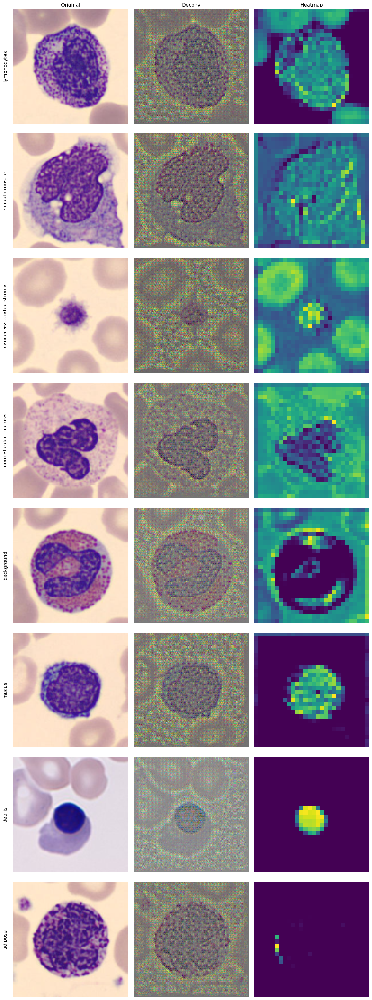

Layer  2


/Users/mar_sangineto/anaconda3/envs/IMAnotebook/lib/python3.12/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


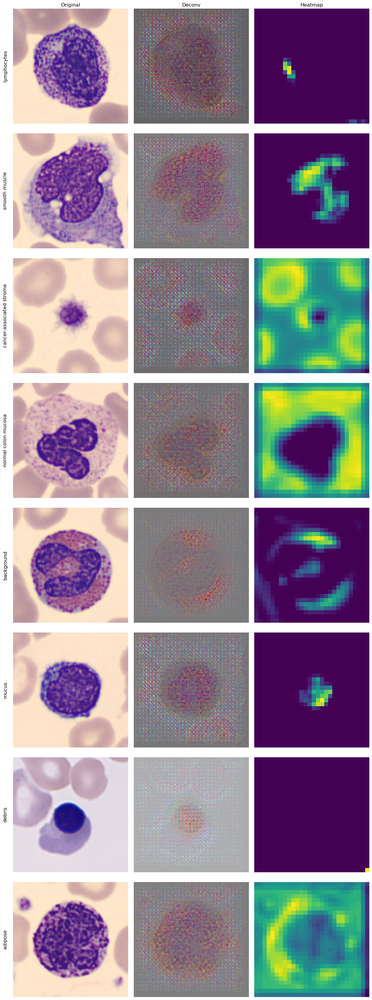

Layer  3


/Users/mar_sangineto/anaconda3/envs/IMAnotebook/lib/python3.12/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


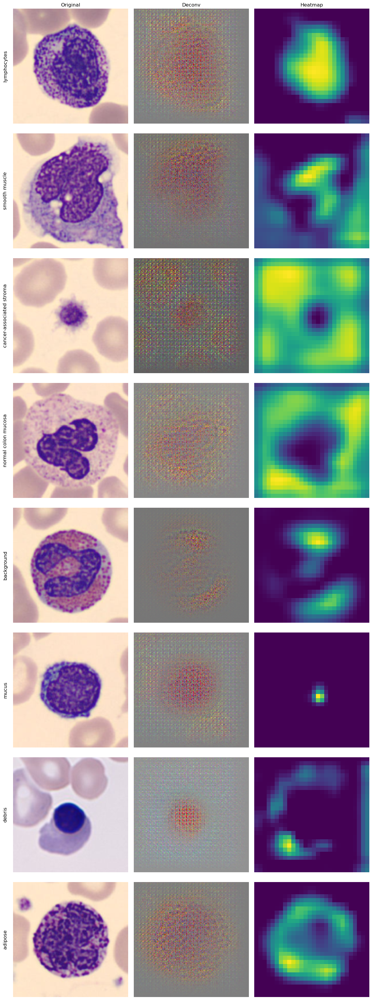

Layer  4


/Users/mar_sangineto/anaconda3/envs/IMAnotebook/lib/python3.12/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


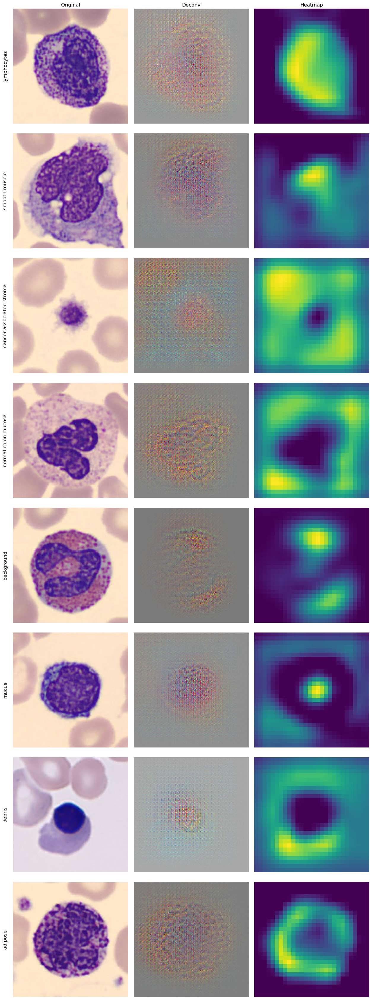

Layer  5


/Users/mar_sangineto/anaconda3/envs/IMAnotebook/lib/python3.12/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


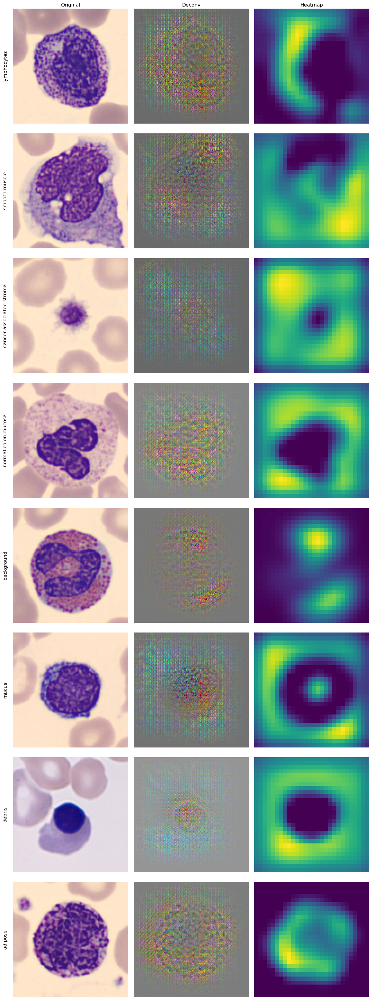

In [19]:
for L in range(5):
    L += 1
    print("Layer ", L)
    classes = {}
    for idx in range(len(imgs)):
        model = AlexNet128(num_classes=num_classes)
    
        state_dict = torch.load(models_dir+model_file,
            map_location=torch.device(device) )
        
        model.load_state_dict(state_dict)
    
        deconv = DeconvNet128(model)
    
        gradcam = GradCam(model)
        
        img = imgs[idx:idx+1]
        clss = int(labels[idx][0])
        _, acts = model(img)

        feat_all = acts[f"feat{L}"]         # [1, C, H, W]
        feat_pos = torch.clamp(feat_all, min=0.0)   # zero‐out negatives
        recon    = deconv(feat_pos, acts, layer=L)  # [1,3,128,128]
        
        if img.dim() == 4:
            x = img[0]
        denorm_rgb = (x * 0.5 + 0.5).clamp(0,1)
        orig_rgb   = denorm_rgb.cpu().permute(1,2,0).numpy()
        deconv_rgb = recon[0].detach().cpu().permute(1,2,0).numpy()
        mn, mx = deconv_rgb.min(), deconv_rgb.max()
        
        deconv_rgb = (deconv_rgb - mn) / (mx - mn + 1e-8)
    
        heatmap = gradcam.compute_heatmap(img,layer=L,target_class=clss)
    
        classes[clss] = (orig_rgb, deconv_rgb, heatmap)

    classes_list = list(classes.keys())
    n = len(classes_list)
    
    fig, axes = plt.subplots(
        n, 3,
        figsize=(12, 4 * n),
        squeeze=False,
        gridspec_kw={'wspace': 0.05, 'hspace': 0}
    )
    
    fig.subplots_adjust(left=0, right=1, top=1.05, bottom=0)
    
    col_titles = ["Original", "Deconv", "Heatmap"]
    for i, cls in enumerate(classes_list):
        orig, deconv, heat = classes[cls]
        class_name = class_names[cls]
    
        sub_fig, sub_axes = plt.subplots(
            1, 3,
            figsize=(12, 4),
            squeeze=False,
            gridspec_kw={'wspace': 0.05, 'hspace': 0}
        )
        sub_fig.subplots_adjust(left=0, right=1, top=1.05, bottom=0)
        
        for j, img in enumerate((orig, deconv, heat)):
            ax = axes[i, j]
            ax.imshow(img)
            ax.axis("off")
            
            sub_ax = sub_axes[0, j]
            sub_ax.imshow(img)
            sub_ax.axis("off")
            if i == 0:
                ax.set_title(col_titles[j], fontsize=12, pad=5)
            sub_ax.set_title(col_titles[j], fontsize=12, pad=5)
        axes[i, 0].text(-0.05, 0.5, class_name,
                        transform=axes[i, 0].transAxes,
                        rotation=90, va="center", ha="right", fontsize=12)
        sub_axes[0, 0].text(-0.05, 0.5, class_name,
                        transform=sub_axes[0, 0].transAxes,
                        rotation=90, va="center", ha="right", fontsize=12)
        sub_fig.savefig(f"./{figs_folder}/comparission{dataset_name}_layer{L}_{class_name}.pdf", 
                format="pdf",
                bbox_inches="tight",
                pad_inches=0)
        plt.close(sub_fig)
    
    
    # saves figure
    fig.savefig(f"./{figs_folder}/comparission{dataset_name}_layer{L}.pdf", 
                format="pdf",
                bbox_inches="tight",
                pad_inches=0)
    
    plt.show()

### Occlusion on Blood

In [ ]:
plot_occlusion_patch(patch_size=32)

In [ ]:
plot_occlusion_patch(patch_size=64)

In [ ]:
plot_occlusion_patch(patch_size=80)

## Testing on Derma

In [20]:
dataset_name = "DermaMNIST"
num_classes = 7
model_file = "alexnet128_dermamnist.pth"

In [21]:
# Loading data

train_loader, val_loader, test_loader = get_data(
    dataset_name=dataset_name,
    im_size=128,
    batch_size=64,
    data_dir=dataset_dir
)

In [22]:
imgs, labels = next(iter(train_loader))
print("raw loader imgs:", imgs.shape)

raw loader imgs: torch.Size([64, 3, 128, 128])


Layer  1


/Users/mar_sangineto/anaconda3/envs/IMAnotebook/lib/python3.12/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


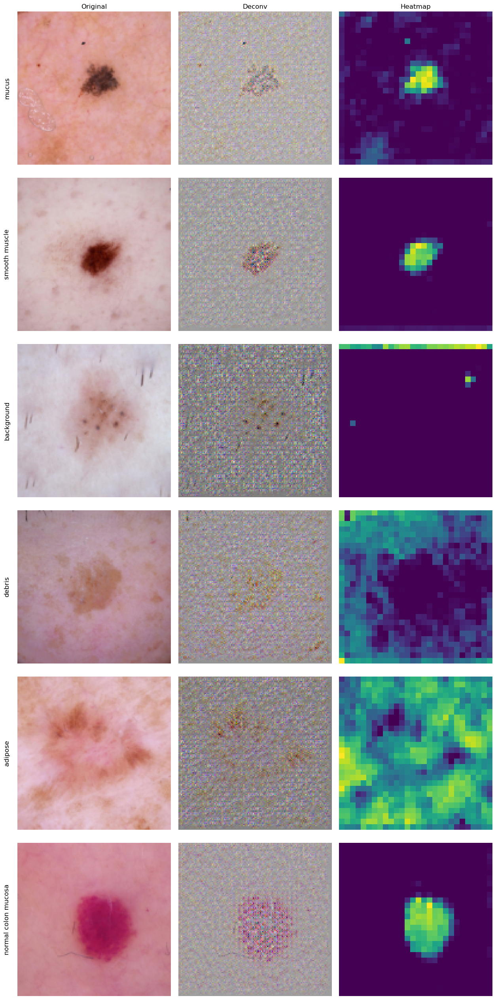

Layer  2


/Users/mar_sangineto/anaconda3/envs/IMAnotebook/lib/python3.12/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


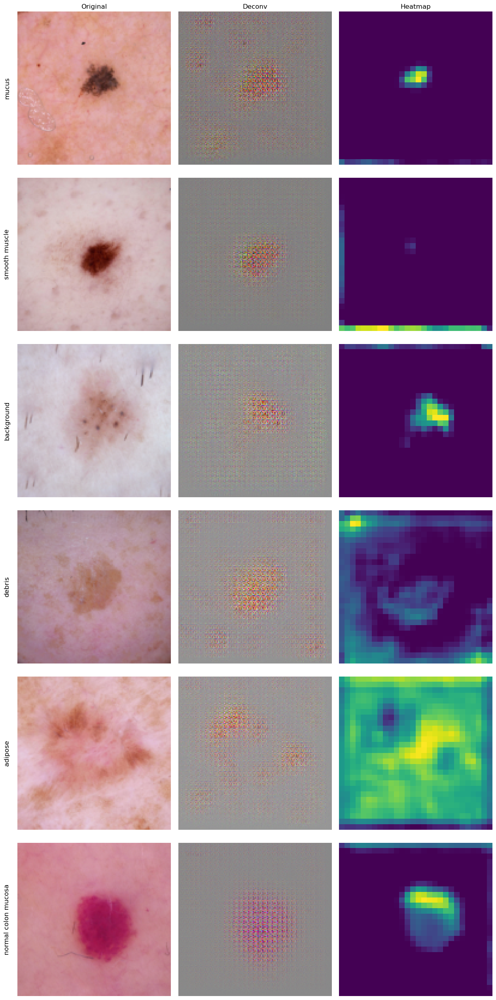

Layer  3


/Users/mar_sangineto/anaconda3/envs/IMAnotebook/lib/python3.12/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


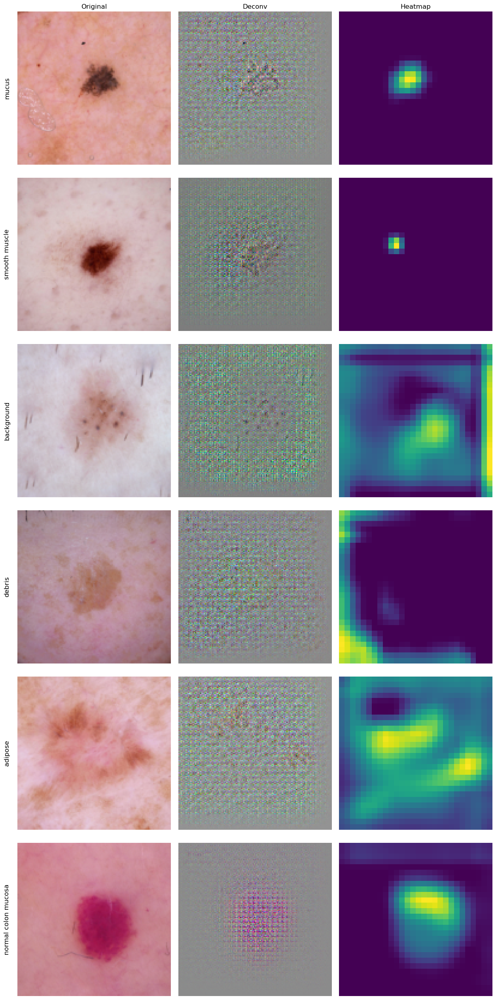

Layer  4


/Users/mar_sangineto/anaconda3/envs/IMAnotebook/lib/python3.12/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


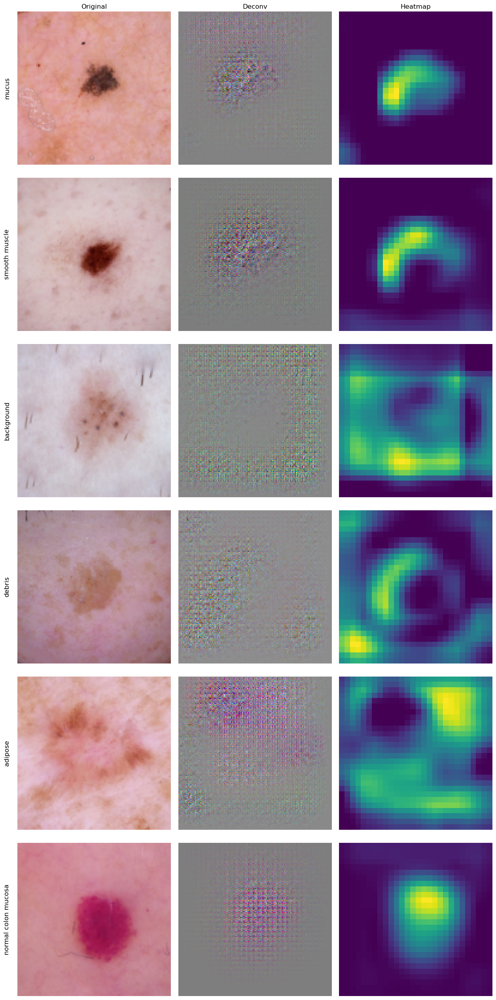

Layer  5


/Users/mar_sangineto/anaconda3/envs/IMAnotebook/lib/python3.12/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


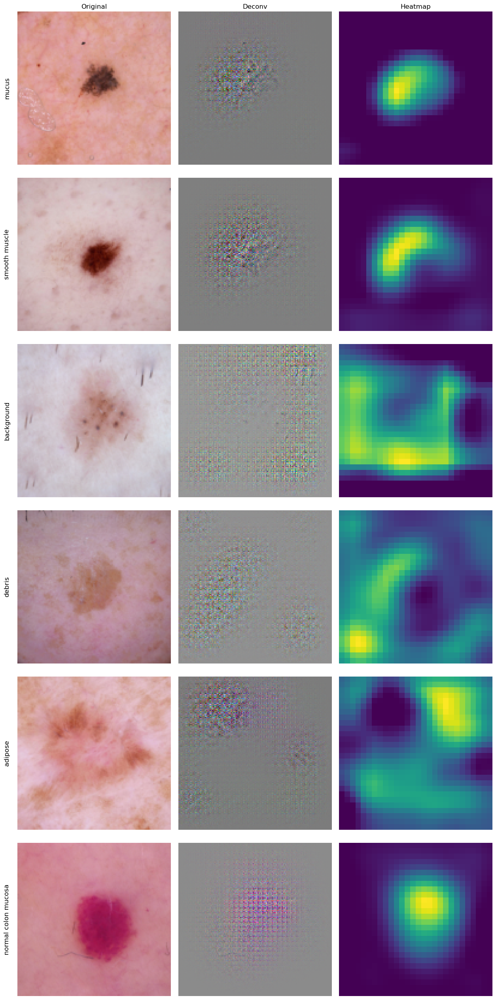

In [23]:
for L in range(5):
    L += 1
    print("Layer ", L)
    classes = {}
    for idx in range(len(imgs)):
        model = AlexNet128(num_classes=num_classes)
    
        state_dict = torch.load(models_dir+model_file,
            map_location=torch.device(device) )
        
        model.load_state_dict(state_dict)
    
        deconv = DeconvNet128(model)
    
        gradcam = GradCam(model)
        
        img = imgs[idx:idx+1]
        clss = int(labels[idx][0])
        _, acts = model(img)

        feat_all = acts[f"feat{L}"]         # [1, C, H, W]
        feat_pos = torch.clamp(feat_all, min=0.0)   # zero‐out negatives
        recon    = deconv(feat_pos, acts, layer=L)  # [1,3,128,128]
        
        if img.dim() == 4:
            x = img[0]
        denorm_rgb = (x * 0.5 + 0.5).clamp(0,1)
        orig_rgb   = denorm_rgb.cpu().permute(1,2,0).numpy()
        deconv_rgb = recon[0].detach().cpu().permute(1,2,0).numpy()
        mn, mx = deconv_rgb.min(), deconv_rgb.max()
        
        deconv_rgb = (deconv_rgb - mn) / (mx - mn + 1e-8)
    
        heatmap = gradcam.compute_heatmap(img,layer=L,target_class=clss)
    
        classes[clss] = (orig_rgb, deconv_rgb, heatmap)

    classes_list = list(classes.keys())
    n = len(classes_list)
    
    fig, axes = plt.subplots(
        n, 3,
        figsize=(12, 4 * n),
        squeeze=False,
        gridspec_kw={'wspace': 0.05, 'hspace': 0}
    )
    
    fig.subplots_adjust(left=0, right=1, top=1.05, bottom=0)
    
    col_titles = ["Original", "Deconv", "Heatmap"]
    for i, cls in enumerate(classes_list):
        orig, deconv, heat = classes[cls]
        class_name = class_names[cls]
    
        sub_fig, sub_axes = plt.subplots(
            1, 3,
            figsize=(12, 4),
            squeeze=False,
            gridspec_kw={'wspace': 0.05, 'hspace': 0}
        )
        sub_fig.subplots_adjust(left=0, right=1, top=1.05, bottom=0)
        
        for j, img in enumerate((orig, deconv, heat)):
            ax = axes[i, j]
            ax.imshow(img)
            ax.axis("off")
            
            sub_ax = sub_axes[0, j]
            sub_ax.imshow(img)
            sub_ax.axis("off")
            if i == 0:
                ax.set_title(col_titles[j], fontsize=12, pad=5)
            sub_ax.set_title(col_titles[j], fontsize=12, pad=5)
        axes[i, 0].text(-0.05, 0.5, class_name,
                        transform=axes[i, 0].transAxes,
                        rotation=90, va="center", ha="right", fontsize=12)
        sub_axes[0, 0].text(-0.05, 0.5, class_name,
                        transform=sub_axes[0, 0].transAxes,
                        rotation=90, va="center", ha="right", fontsize=12)
        sub_fig.savefig(f"./{figs_folder}/comparission{dataset_name}_layer{L}_{class_name}.pdf", 
                format="pdf",
                bbox_inches="tight",
                pad_inches=0)
        plt.close(sub_fig)
    
    
    # saves figure
    fig.savefig(f"./{figs_folder}/comparission{dataset_name}_layer{L}.pdf", 
                format="pdf",
                bbox_inches="tight",
                pad_inches=0)
    
    plt.show()

### Occlusion on Derma

In [ ]:
plot_occlusion_patch(patch_size=32)

In [ ]:
plot_occlusion_patch(patch_size=64)

In [ ]:
plot_occlusion_patch(patch_size=80)